# Restore individual models

In [1]:
%matplotlib inline

import numpy as np
import tensorflow as tf 
import matplotlib.pyplot as plt
import os 
import matplotlib.pyplot as plt
from matplotlib.image import imread
from scipy.misc import imsave
from scipy.misc import imresize
import numpy as np
from numpy import genfromtxt
import tensorflow as tf
from PIL import Image
import pickle
# from tensorflow_vgg import vgg16
import collections
import time
import math

## Load Auto_Encoder_weights

In [2]:
# 5f - 10f
loaded_graph = tf.Graph()
save_model_path = './checkpoints_view_invariant/5to10_lr=0.0007_nl=3_bs=80.ckpt'
with tf.Session(graph=loaded_graph) as sess:
    # Load model
    loader = tf.train.import_meta_graph(save_model_path + '.meta')
    loader.restore(sess, save_model_path)

    # Get Tensors from loaded model
    Au1w1 = loaded_graph.get_tensor_by_name('conv_layers/conv_weights_1:0').eval()
    Au1b1 = loaded_graph.get_tensor_by_name('conv_layers/bias_1:0').eval()
    Au1w2 = loaded_graph.get_tensor_by_name('conv_layers/conv_weights_2:0').eval()
    Au1b2 = loaded_graph.get_tensor_by_name('conv_layers/bias_2:0').eval()
    Au1w3 = loaded_graph.get_tensor_by_name('conv_layers/conv_weights_3:0').eval()
    Au1b3 = loaded_graph.get_tensor_by_name('conv_layers/bias_3:0').eval()
    Au1deW1 = loaded_graph.get_tensor_by_name('deconv_layers/deconv_weights_1:0').eval()
    Au1deB1 = loaded_graph.get_tensor_by_name('deconv_layers/debias_1:0').eval()

INFO:tensorflow:Restoring parameters from ./checkpoints_view_invariant/5to10_lr=0.0007_nl=3_bs=80.ckpt


In [3]:
# 10f - 15f
loaded_graph = tf.Graph()
save_model_path = './checkpoints_view_invariant/10to15_lr=0.0007_nl=3_bs=80.ckpt'
with tf.Session(graph=loaded_graph) as sess:
    # Load model
    loader = tf.train.import_meta_graph(save_model_path + '.meta')
    loader.restore(sess, save_model_path)

    # Get Tensors from loaded model
    Au2deW1 = loaded_graph.get_tensor_by_name('deconv_layers/deconv_weights_1:0').eval()
    Au2deB1 = loaded_graph.get_tensor_by_name('deconv_layers/debias_1:0').eval()
    # Val X1
# val_x = gallery_full[2500:, 0]
# val_x = np.reshape(val_x, [val_x.shape[0], val_x.shape[1], val_x.shape[2], 1])
# # Val Y
# val_y = gallery_full[2500:, 3]
# val_y = np.reshape(val_y, [val_y.shape[0], val_y.shape[1], val_y.shape[2], 1])
# print('val_x', val_x.shape, 'val_y', val_y.shape)
# me('deconv_layers/debias_1:0').eval()

INFO:tensorflow:Restoring parameters from ./checkpoints_view_invariant/10to15_lr=0.0007_nl=3_bs=80.ckpt


In [4]:
# 15f - 20f
loaded_graph = tf.Graph()
save_model_path = './checkpoints_view_invariant/15to20_dg=85_lr=0.0007_nl=3_bs=80.ckpt'
with tf.Session(graph=loaded_graph) as sess:
    # Load model
    loader = tf.train.import_meta_graph(save_model_path + '.meta')
    loader.restore(sess, save_model_path)

    # Get Tensors from loaded model
    Au3deW1 = loaded_graph.get_tensor_by_name('deconv_layers/deconv_weights_1:0').eval()
    Au3deB1 = loaded_graph.get_tensor_by_name('deconv_layers/debias_1:0').eval()
#     Au3deW2 = loaded_graph.get_tensor_by_name('deconv_layers/deconv_weights_2:0').eval()
#     Au3deB2 = loaded_graph.get_tensor_by_name('deconv_layers/debias_2:0').eval()
#     Au3outW = loaded_graph.get_tensor_by_name('output_layer/output_weights:0').eval()
#     Au3outb = loaded_graph.get_tensor_by_name('output_layer/outbias_1:0').eval()

INFO:tensorflow:Restoring parameters from ./checkpoints_view_invariant/15to20_dg=85_lr=0.0007_nl=3_bs=80.ckpt


In [5]:
# 20f - full
loaded_graph = tf.Graph()
save_model_path = './checkpoints_view_invariant/20toFull_dg=85_lr=0.0007_nl=3_bs=80.ckpt'
with tf.Session(graph=loaded_graph) as sess:
    # Load model
    loader = tf.train.import_meta_graph(save_model_path + '.meta')
    loader.restore(sess, save_model_path)

    # Get Tensors from loaded model
    Au4deW1 = loaded_graph.get_tensor_by_name('deconv_layers/deconv_weights_1:0').eval()
    Au4deB1 = loaded_graph.get_tensor_by_name('deconv_layers/debias_1:0').eval()
    Au4deW2 = loaded_graph.get_tensor_by_name('deconv_layers/deconv_weights_2:0').eval()
    Au4deB2 = loaded_graph.get_tensor_by_name('deconv_layers/debias_2:0').eval()
    Au4deW3 = loaded_graph.get_tensor_by_name('deconv_layers/deconv_weights_3:0').eval()
    Au4deB3 = loaded_graph.get_tensor_by_name('deconv_layers/debias_3:0').eval()
    Au4outW = loaded_graph.get_tensor_by_name('output_layer/output_weights:0').eval()
    Au4outB = loaded_graph.get_tensor_by_name('output_layer/outbias_1:0').eval()

INFO:tensorflow:Restoring parameters from ./checkpoints_view_invariant/20toFull_dg=85_lr=0.0007_nl=3_bs=80.ckpt


In [6]:
Au4deW2.shape

(4, 4, 8, 16)

In [7]:
gallery_full = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_full_Seq00', mode='rb'))
probe_full = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_full_Seq01', mode='rb'))
gallery_5f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_Seq00', mode='rb'))
probe_5f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_Seq01', mode='rb'))
gallery_full = gallery_full/float(255)
probe_full = probe_full/float(255)
gallery_5f = gallery_5f/float(255)
probe_5f = probe_5f/float(255)

In [8]:
# Train X
train_x = np.concatenate([gallery_5f[:2146, 3], probe_5f[:2146, 3]], axis=0)
train_x = np.reshape(train_x, [train_x.shape[0], train_x.shape[1], train_x.shape[2], 1])
# Train Y
train_y = np.concatenate([gallery_full[:2146, 3], probe_full[:2146, 3]], axis=0)
train_y = np.reshape(train_y, [train_y.shape[0], train_y.shape[1], train_y.shape[2], 1])
print('train_x', train_x.shape, 'train_y', train_y.shape)

# Val X
val_x = gallery_5f[2146:2646, 3]
val_x = np.reshape(val_x, [val_x.shape[0], val_x.shape[1], val_x.shape[2], 1])
# Val Y
val_y = gallery_full[2146:2646, 3]
val_y = np.reshape(val_y, [val_y.shape[0], val_y.shape[1], val_y.shape[2], 1])
print('val_x', val_x.shape, 'val_y', val_y.shape)

# Test X
test_x = probe_5f[2646:, 3]
test_x = np.reshape(test_x, [test_x.shape[0], test_x.shape[1], test_x.shape[2], 1])
# Test Y
test_y = probe_full[2646:, 3]
test_y = np.reshape(test_y, [test_y.shape[0], test_y.shape[1], test_y.shape[2], 1])
print('test_x', test_x.shape, 'test_y', test_y.shape)

train_x (4292, 64, 64, 1) train_y (4292, 64, 64, 1)
val_x (500, 64, 64, 1) val_y (500, 64, 64, 1)
test_x (500, 64, 64, 1) test_y (500, 64, 64, 1)


## Build End to End

In [9]:
def conv_layer(inputs_, weight, weight_name, bias, bias_name, conv_name, pool_name, bn_name, relu_name, add_bacth_norm=True, is_training=True,
               out_dim=1, conv_kernsize=(2,2), conv_strides=(1,1), pool_size=(2,2), pool_strides=(2,2), keep_prob=0.5):
    ### Encoder
    # e.g. out_dim: 8; kern_size: (3,3); pool_size: (2,2); strides: (2,2);
    
    # Weights
    Weights = tf.Variable(weight, name=weight_name)
    
    # Bias
    Bias = tf.Variable(bias, name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    # filter:[filter_height, filter_width, in_channels, out_channels]
    # input:[batch, in_height, in_width, in_channels]
    conv2d = tf.nn.bias_add(tf.nn.conv2d(inputs_, Weights, stride, padding='SAME', name=conv_name), Bias)
            
    # add activation function
    conv2d = tf.nn.relu(conv2d, name=relu_name)
    
    # add Max pooling
    conv2d = tf.nn.max_pool(conv2d, [1,pool_size[0],pool_size[1],1],\
                                    [1,pool_strides[0],pool_strides[1],1], padding='SAME', name=pool_name)
                    
    conv2d = tf.layers.dropout(conv2d, rate=keep_prob)
    
    # Now 28x28x
    if add_bacth_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)

    return conv2d

def deconv_layer(encoded, up_name, weight, weight_name, bias, bias_name, de_conv_name, bn_name, relu_name, add_batch_norm=True, is_training=True,
                 up_size=[(2,2),(4,4),(5,5),(6,6)], out_dim=1, conv_kernsize=(2,2), conv_strides=(1,1), keep_prob=0.5):
    ### Decoder
    upsample = tf.image.resize_nearest_neighbor(encoded, up_size, name=up_name) # up_size: e.g.(7,7)
    
    # Weights
    Weights = tf.Variable(weight, name=weight_name)
    
    # Bias
    Bias = tf.Variable(bias, name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    conv2d = tf.nn.bias_add(tf.nn.conv2d(upsample, Weights, stride, padding='SAME', name=de_conv_name),\
                   Bias)
    
    conv2d = tf.nn.relu(conv2d, name=relu_name)
    
    conv2d = tf.layers.dropout(conv2d, rate=keep_prob)
    
    if add_batch_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)

    return conv2d

def output_layer(conv2d, weight, weight_name, bias, bias_name, logits_name, bn_name, decoded_name, add_batch_norm=True, is_training=True, 
                 out_dim=1, conv_kernsize=(3,3), conv_strides=(1,1)):
    # Weights
    Weights = tf.Variable(weight, name=weight_name)
    
    # Bias
    Bias = tf.Variable(bias, name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    logits = tf.nn.bias_add(tf.nn.conv2d(conv2d, Weights, stride, padding='SAME', name=logits_name),\
                   Bias)
    
#     if add_batch_norm:
#         conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
    #Now 28x28x1
    decoded = tf.nn.sigmoid(logits, name=decoded_name)
    
    return logits, decoded

In [10]:
conv_kern_size = (4,4)
conv_strides = (1,1)
pool_size = (2,2)
pool_strides = (2,2)
up_size = [(16,16), (32,32), (64,64)]
de_kern_size = (4,4)
de_conv_strides = (1,1)
out_kern_size = (4,4)
out_strides = (1,1)


g = tf.Graph()
tf.reset_default_graph()
with g.as_default():
    
    Au1_Weights_1 = tf.convert_to_tensor(Au1w1, dtype=tf.float32)
    Au1_Bias_1 = tf.convert_to_tensor(Au1b1, dtype=tf.float32)
    Au1_Weights_2 = tf.convert_to_tensor(Au1w2, dtype=tf.float32)
    Au1_Bias_2 = tf.convert_to_tensor(Au1b2, dtype=tf.float32)
    Au1_Weights_3 = tf.convert_to_tensor(Au1w3, dtype=tf.float32)
    Au1_Bias_3 = tf.convert_to_tensor(Au1b3, dtype=tf.float32)
    Au1_deWeights_1 = tf.convert_to_tensor(Au1deW1, dtype=tf.float32)
    Au1_deBias_1 = tf.convert_to_tensor(Au1deB1, dtype=tf.float32)
    
    Au2_deWeights_1 = tf.convert_to_tensor(Au2deW1, dtype=tf.float32)
    Au2_deBias_1 = tf.convert_to_tensor(Au2deB1, dtype=tf.float32)
    
    Au3_deWeights_1 = tf.convert_to_tensor(Au3deW1, dtype=tf.float32)
    Au3_deBias_1 = tf.convert_to_tensor(Au3deB1, dtype=tf.float32)
    
    Au4_deWeights_1 = tf.convert_to_tensor(Au4deW1, dtype=tf.float32)
    Au4_deBias_1 = tf.convert_to_tensor(Au4deB1, dtype=tf.float32)
    Au4_deWeights_2 = tf.convert_to_tensor(Au4deW2, dtype=tf.float32)
    Au4_deBias_2 = tf.convert_to_tensor(Au4deB2, dtype=tf.float32)
    Au4_deWeights_3 = tf.convert_to_tensor(Au4deW3, dtype=tf.float32)
    Au4_deBias_3 = tf.convert_to_tensor(Au4deB3, dtype=tf.float32)
    Au4_outWeights = tf.convert_to_tensor(Au4outW, dtype=tf.float32)
    Au4_outBias = tf.convert_to_tensor(Au4outB, dtype=tf.float32)
    
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    keep_p = tf.placeholder(tf.float32, name="keep_prob")
    training = tf.placeholder(tf.bool, name='training')
    inputs = tf.placeholder(tf.float32, [None, 64, 64, 1], name='inputs')
    targets = tf.placeholder(tf.float32, [None, 64, 64, 1], name='targets')

    # 128x88 -- 16x11
    with tf.name_scope('conv_layer'):
        # outdim 1 -- 32
        maxpool_1 = conv_layer(inputs, Au1_Weights_1, 'weight_1', Au1_Bias_1, 'bias_1', 'conv_1', 'pool_1', 'bn_1', 'relu_1', add_bacth_norm=False, 
                               is_training=training, out_dim=32, conv_kernsize=conv_kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
        maxpool_2 = conv_layer(maxpool_1, Au1_Weights_2, 'weight_2', Au1_Bias_2, 'bias_2', 'conv_2', 'pool_2', 'bn_2', 'relu_2', add_bacth_norm=True, 
                               is_training=training, out_dim=16, conv_kernsize=conv_kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
        maxpool_3 = conv_layer(maxpool_2, Au1_Weights_3, 'weight_3', Au1_Bias_3, 'bias_3', 'conv_3', 'pool_3', 'bn_3', 'relu_3', add_bacth_norm=True, 
                               is_training=training, out_dim=8, conv_kernsize=conv_kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
    with tf.name_scope('hidden_layers'):
        # outdim 8 -- 8
        stride = [1, conv_strides[0], conv_strides[1], 1]
        
        # 5f - 10f 16x11x8 -- 16x11x8
        Au1deWeights1 = tf.Variable(Au1_deWeights_1, name='h_weight_1')
        Au1deBias1 = tf.Variable(Au1_deBias_1, name='h_bias_1')
        conv_hidden_1 = tf.nn.bias_add(tf.nn.conv2d(maxpool_3, Au1deWeights1, stride, padding='SAME', name='hidden_1'), Au1deBias1)
        conv_hidden_1 = tf.layers.batch_normalization(conv_hidden_1, training=training, name='h_bn_1')
        
        conv_hidden_1 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_1, Au1deWeights1, stride, padding='SAME', name='hidden_1_1'), Au1deBias1)
        conv_hidden_1 = tf.layers.batch_normalization(conv_hidden_1, training=training, name='h_bn_1_1')
        
        conv_hidden_1 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_1, Au1deWeights1, stride, padding='SAME', name='hidden_1_2'), Au1deBias1)
        conv_hidden_1 = tf.layers.batch_normalization(conv_hidden_1, training=training, name='h_bn_1_2')
        
        # 10f - 15f 16x11x8 -- 16x11x8
        Au2deWeights1 = tf.Variable(Au2_deWeights_1, name='h_weight_2')
        Au2deBias1 = tf.Variable(Au2_deBias_1, name='h_bias_2')
        conv_hidden_2 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_1, Au2deWeights1, stride, padding='SAME', name='hidden_2'), Au2deBias1)
        conv_hidden_2 = tf.layers.batch_normalization(conv_hidden_2, training=training, name='h_bn_2')
        
        conv_hidden_2 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_2, Au2deWeights1, stride, padding='SAME', name='hidden_2_1'), Au2deBias1)
        conv_hidden_2 = tf.layers.batch_normalization(conv_hidden_2, training=training, name='h_bn_2_1')
        
        conv_hidden_2 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_2, Au2deWeights1, stride, padding='SAME', name='hidden_2_2'), Au2deBias1)
        conv_hidden_2 = tf.layers.batch_normalization(conv_hidden_2, training=training, name='h_bn_2_2')

        # 15f - 20f 16x11x8 -- 16x11x8
        Au3deWeights1 = tf.Variable(Au3_deWeights_1, name='h_weight_3')
        Au3deBias1 = tf.Variable(Au3_deBias_1, name='h_bias_3')
        conv_hidden_3 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_2, Au3deWeights1, stride, padding='SAME', name='hidden_3'), Au3deBias1)
        conv_hidden_3 = tf.layers.batch_normalization(conv_hidden_3, training=training, name='h_bn_3')
        
        conv_hidden_3 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_3, Au3deWeights1, stride, padding='SAME', name='hidden_3_1'), Au3deBias1)
        conv_hidden_3 = tf.layers.batch_normalization(conv_hidden_3, training=training, name='h_bn_3_1')
    
        conv_hidden_3 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_3, Au3deWeights1, stride, padding='SAME', name='hidden_3_2'), Au3deBias1)
        conv_hidden_3 = tf.layers.batch_normalization(conv_hidden_3, training=training, name='h_bn_3_2')

        # 20f - full 16x11x8 -- 16x11x8
        Au4deWeights1 = tf.Variable(Au4_deWeights_1, name='h_weight_4')
        Au4deBias1 = tf.Variable(Au4_deBias_1, name='h_bias_4')
        conv_hidden_4 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_3, Au4deWeights1, stride, padding='SAME', name='hidden_4'), Au4deBias1)
        conv_hidden_4 = tf.layers.batch_normalization(conv_hidden_4, training=training, name='h_bn_4')
        
        conv_hidden_4 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_4, Au4deWeights1, stride, padding='SAME', name='hidden_4_1'), Au4deBias1)
        conv_hidden_4 = tf.layers.batch_normalization(conv_hidden_4, training=training, name='h_bn_4_1')
        
        conv_hidden_4 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_4, Au4deWeights1, stride, padding='SAME', name='hidden_4_2'), Au4deBias1)
        conv_hidden_4 = tf.layers.batch_normalization(conv_hidden_4, training=training, name='h_bn_4_2')

    with tf.name_scope('deconv_layers'):
        # outdim 8 -- 16
        deconv_1 = deconv_layer(conv_hidden_4, 'up_1', Au4_deWeights_1, 'deWeight_1', Au4_deBias_1, 'deBias_1', 'deconv_1', 'debn_1', 'derelu_1', add_batch_norm=True, is_training=training,
                     up_size=up_size[0], out_dim=8, conv_kernsize=de_kern_size, conv_strides=de_conv_strides, keep_prob=keep_p)
        
        deconv_2 = deconv_layer(deconv_1, 'up_2', Au4_deWeights_2, 'deWeight_2', Au4_deBias_2, 'deBias_2', 'deconv_2', 'debn_2', 'derelu_2', add_batch_norm=True, is_training=training,
                     up_size=up_size[1], out_dim=16, conv_kernsize=de_kern_size, conv_strides=de_conv_strides, keep_prob=keep_p)
        
        deconv_3 = deconv_layer(deconv_2, 'up_3', Au4_deWeights_3, 'deWeight_3', Au4_deBias_3, 'deBias_3', 'deconv_3', 'debn_3', 'derelu_3', add_batch_norm=True, is_training=training,
                     up_size=up_size[2], out_dim=32, conv_kernsize=de_kern_size, conv_strides=de_conv_strides, keep_prob=keep_p)

    with tf.name_scope('output_layer'):
        # outdim 32 -- 1
        logits, decoded = output_layer(deconv_3, Au4_outWeights, 'outWeight', Au4_outBias, 'outBias', 'logits', 'outbn', 'output', add_batch_norm=True, is_training=training, 
                                       out_dim=1, conv_kernsize=out_kern_size, conv_strides=out_strides)

    # Now 64x64x1 Output
    MSE = tf.reduce_mean(tf.losses.mean_squared_error(targets, decoded), name='MSE')
    loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=targets, logits=logits, name='loss')
    cost = tf.reduce_mean(loss, name='cost')
#     loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=targets, logits=logits, name='loss')
#     cost = tf.reduce_mean(loss, name='cost')
    opt = tf.train.AdamOptimizer(learning_rate).minimize(cost)

    with tf.name_scope('saver'):
        saver = tf.train.Saver()

In [11]:
def get_batches(data, target, batch_size):
    n_batches = len(data)//batch_size
    data = data[:batch_size * n_batches]
    target = target[:batch_size * n_batches]
    for ii in range(0, batch_size*n_batches, batch_size):
        data_batch = data[ii:ii + batch_size]
        target_batch = target[ii:ii + batch_size]
        
        yield data_batch, target_batch
        
        
def cal_accuracy(decoded, target):
    error = abs(decoded - target)
    Acc = (np.sum(error <= 0.08)/(decoded.shape[0]*decoded.shape[1]*decoded.shape[2]*decoded.shape[3]))*100
    
    return Acc

Epoch: 1/3000,  Iteration: 25,  Train loss: 0.944,  Train MSE: 0.125,  0.0s /batch.  Train Accuracy: %52.724
Epoch: 1/3000,  Iteration: 50,  Train loss: 0.472,  Train MSE: 0.060,  0.0s /batch.  Train Accuracy: %57.026
Epoch: 2/3000,  Iteration: 75,  Train loss: 0.343,  Train MSE: 0.037,  0.0s /batch.  Train Accuracy: %63.835

Validation loss: 0.345,  Validation MSE: 0.038,  Validation accuracy: 63.680,

Epoch: 2/3000,  Iteration: 100,  Train loss: 0.296,  Train MSE: 0.028,  0.0s /batch.  Train Accuracy: %67.497
Epoch: 3/3000,  Iteration: 125,  Train loss: 0.284,  Train MSE: 0.026,  0.0s /batch.  Train Accuracy: %68.925
Epoch: 3/3000,  Iteration: 150,  Train loss: 0.265,  Train MSE: 0.022,  0.0s /batch.  Train Accuracy: %70.519

Validation loss: 0.269,  Validation MSE: 0.022,  Validation accuracy: 70.251,

Epoch: 4/3000,  Iteration: 175,  Train loss: 0.252,  Train MSE: 0.019,  0.0s /batch.  Train Accuracy: %72.069
Epoch: 4/3000,  Iteration: 200,  Train loss: 0.252,  Train MSE: 0.018,  0

Epoch: 29/3000,  Iteration: 1525,  Train loss: 0.208,  Train MSE: 0.007,  0.0s /batch.  Train Accuracy: %82.751
Epoch: 30/3000,  Iteration: 1550,  Train loss: 0.202,  Train MSE: 0.008,  0.0s /batch.  Train Accuracy: %82.814
Epoch: 30/3000,  Iteration: 1575,  Train loss: 0.217,  Train MSE: 0.007,  0.0s /batch.  Train Accuracy: %81.731

Validation loss: 0.207,  Validation MSE: 0.008,  Validation accuracy: 81.687,

Epoch: 31/3000,  Iteration: 1600,  Train loss: 0.205,  Train MSE: 0.007,  0.0s /batch.  Train Accuracy: %83.111
Epoch: 31/3000,  Iteration: 1625,  Train loss: 0.217,  Train MSE: 0.008,  0.0s /batch.  Train Accuracy: %80.897
Epoch: 32/3000,  Iteration: 1650,  Train loss: 0.206,  Train MSE: 0.007,  0.0s /batch.  Train Accuracy: %82.188

Validation loss: 0.207,  Validation MSE: 0.008,  Validation accuracy: 80.888,

Epoch: 32/3000,  Iteration: 1675,  Train loss: 0.207,  Train MSE: 0.007,  0.0s /batch.  Train Accuracy: %81.723
Epoch: 33/3000,  Iteration: 1700,  Train loss: 0.212,  T

Epoch: 58/3000,  Iteration: 3025,  Train loss: 0.205,  Train MSE: 0.005,  0.0s /batch.  Train Accuracy: %85.028
Epoch: 58/3000,  Iteration: 3050,  Train loss: 0.206,  Train MSE: 0.006,  0.0s /batch.  Train Accuracy: %84.197
Epoch: 59/3000,  Iteration: 3075,  Train loss: 0.197,  Train MSE: 0.006,  0.0s /batch.  Train Accuracy: %84.375

Validation loss: 0.198,  Validation MSE: 0.005,  Validation accuracy: 84.710,

Epoch: 59/3000,  Iteration: 3100,  Train loss: 0.196,  Train MSE: 0.005,  0.0s /batch.  Train Accuracy: %85.463
Epoch: 59/3000,  Iteration: 3125,  Train loss: 0.201,  Train MSE: 0.006,  0.0s /batch.  Train Accuracy: %84.418
Epoch: 60/3000,  Iteration: 3150,  Train loss: 0.198,  Train MSE: 0.005,  0.0s /batch.  Train Accuracy: %85.093

Validation loss: 0.199,  Validation MSE: 0.005,  Validation accuracy: 84.440,

Epoch: 60/3000,  Iteration: 3175,  Train loss: 0.199,  Train MSE: 0.005,  0.0s /batch.  Train Accuracy: %85.060
Epoch: 61/3000,  Iteration: 3200,  Train loss: 0.195,  T

Epoch: 86/3000,  Iteration: 4525,  Train loss: 0.193,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %86.952
Epoch: 86/3000,  Iteration: 4550,  Train loss: 0.201,  Train MSE: 0.005,  0.0s /batch.  Train Accuracy: %86.075
Epoch: 87/3000,  Iteration: 4575,  Train loss: 0.194,  Train MSE: 0.005,  0.0s /batch.  Train Accuracy: %86.224

Validation loss: 0.195,  Validation MSE: 0.005,  Validation accuracy: 86.047,

Epoch: 87/3000,  Iteration: 4600,  Train loss: 0.191,  Train MSE: 0.005,  0.0s /batch.  Train Accuracy: %86.592
Epoch: 88/3000,  Iteration: 4625,  Train loss: 0.195,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %87.041
Epoch: 88/3000,  Iteration: 4650,  Train loss: 0.191,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %86.851

Validation loss: 0.195,  Validation MSE: 0.005,  Validation accuracy: 85.233,

Epoch: 89/3000,  Iteration: 4675,  Train loss: 0.198,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %86.851
Epoch: 89/3000,  Iteration: 4700,  Train loss: 0.202,  T

Epoch: 114/3000,  Iteration: 6025,  Train loss: 0.200,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %87.675
Epoch: 115/3000,  Iteration: 6050,  Train loss: 0.195,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %88.210
Epoch: 115/3000,  Iteration: 6075,  Train loss: 0.197,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %87.503

Validation loss: 0.195,  Validation MSE: 0.004,  Validation accuracy: 86.111,

Epoch: 116/3000,  Iteration: 6100,  Train loss: 0.195,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %86.743
Epoch: 116/3000,  Iteration: 6125,  Train loss: 0.198,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %86.843
Epoch: 117/3000,  Iteration: 6150,  Train loss: 0.197,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %86.846

Validation loss: 0.193,  Validation MSE: 0.004,  Validation accuracy: 86.825,

Epoch: 117/3000,  Iteration: 6175,  Train loss: 0.194,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %86.642
Epoch: 117/3000,  Iteration: 6200,  Train loss: 0

Epoch: 142/3000,  Iteration: 7525,  Train loss: 0.196,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %87.967
Epoch: 143/3000,  Iteration: 7550,  Train loss: 0.193,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %87.621
Epoch: 143/3000,  Iteration: 7575,  Train loss: 0.187,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %88.411

Validation loss: 0.192,  Validation MSE: 0.004,  Validation accuracy: 87.772,

Epoch: 144/3000,  Iteration: 7600,  Train loss: 0.192,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %88.070
Epoch: 144/3000,  Iteration: 7625,  Train loss: 0.192,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %88.154
Epoch: 145/3000,  Iteration: 7650,  Train loss: 0.194,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %87.544

Validation loss: 0.192,  Validation MSE: 0.004,  Validation accuracy: 87.054,

Epoch: 145/3000,  Iteration: 7675,  Train loss: 0.195,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %88.105
Epoch: 146/3000,  Iteration: 7700,  Train loss: 0

Epoch: 171/3000,  Iteration: 9025,  Train loss: 0.192,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %87.760
Epoch: 171/3000,  Iteration: 9050,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.209
Epoch: 172/3000,  Iteration: 9075,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.273

Validation loss: 0.192,  Validation MSE: 0.004,  Validation accuracy: 87.545,

Epoch: 172/3000,  Iteration: 9100,  Train loss: 0.195,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %88.301
Epoch: 173/3000,  Iteration: 9125,  Train loss: 0.202,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %88.444
Epoch: 173/3000,  Iteration: 9150,  Train loss: 0.195,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %88.976

Validation loss: 0.192,  Validation MSE: 0.004,  Validation accuracy: 87.379,

Epoch: 174/3000,  Iteration: 9175,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %88.965
Epoch: 174/3000,  Iteration: 9200,  Train loss: 0

Epoch: 199/3000,  Iteration: 10500,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %88.951

Validation loss: 0.192,  Validation MSE: 0.004,  Validation accuracy: 87.441,



/usr/home/rez/anaconda3/envs/tensorflow/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Epoch: 199/3000,  Iteration: 10525,  Train loss: 0.203,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %88.311
Epoch: 200/3000,  Iteration: 10550,  Train loss: 0.194,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %88.403
Epoch: 200/3000,  Iteration: 10575,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %88.740

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 88.320,

Epoch: 200/3000,  Iteration: 10600,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.239
Epoch: 201/3000,  Iteration: 10625,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %88.961
Epoch: 201/3000,  Iteration: 10650,  Train loss: 0.194,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.128

Validation loss: 0.191,  Validation MSE: 0.003,  Validation accuracy: 88.421,

Epoch: 202/3000,  Iteration: 10675,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %88.870
Epoch: 202/3000,  Iteration: 10700,  Train

Epoch: 227/3000,  Iteration: 12000,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %88.913

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 88.710,

Epoch: 227/3000,  Iteration: 12025,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.344
Epoch: 228/3000,  Iteration: 12050,  Train loss: 0.189,  Train MSE: 0.004,  0.0s /batch.  Train Accuracy: %88.699
Epoch: 228/3000,  Iteration: 12075,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.037

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 88.447,

Epoch: 229/3000,  Iteration: 12100,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %88.954
Epoch: 229/3000,  Iteration: 12125,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.125
Epoch: 230/3000,  Iteration: 12150,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.776

Validation loss: 0.191,  Validation MSE: 

Epoch: 254/3000,  Iteration: 13450,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.288
Epoch: 255/3000,  Iteration: 13475,  Train loss: 0.185,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.049
Epoch: 255/3000,  Iteration: 13500,  Train loss: 0.199,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.026

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 88.144,

Epoch: 256/3000,  Iteration: 13525,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.897
Epoch: 256/3000,  Iteration: 13550,  Train loss: 0.199,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.072
Epoch: 257/3000,  Iteration: 13575,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.739

Validation loss: 0.192,  Validation MSE: 0.004,  Validation accuracy: 87.682,

Epoch: 257/3000,  Iteration: 13600,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.114
Epoch: 258/3000,  Iteration: 13625,  Train

Epoch: 282/3000,  Iteration: 14925,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.302

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 88.228,

Epoch: 283/3000,  Iteration: 14950,  Train loss: 0.196,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.410
Epoch: 283/3000,  Iteration: 14975,  Train loss: 0.197,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.017
Epoch: 284/3000,  Iteration: 15000,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %88.640

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.114,

Epoch: 284/3000,  Iteration: 15025,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.413
Epoch: 284/3000,  Iteration: 15050,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.057
Epoch: 285/3000,  Iteration: 15075,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.866

Validation loss: 0.190,  Validation MSE: 

Epoch: 309/3000,  Iteration: 16375,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.149
Epoch: 310/3000,  Iteration: 16400,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.966
Epoch: 310/3000,  Iteration: 16425,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.811

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.139,

Epoch: 311/3000,  Iteration: 16450,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.025
Epoch: 311/3000,  Iteration: 16475,  Train loss: 0.195,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.396
Epoch: 312/3000,  Iteration: 16500,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.695

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 88.579,

Epoch: 312/3000,  Iteration: 16525,  Train loss: 0.185,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.162
Epoch: 313/3000,  Iteration: 16550,  Train

Epoch: 337/3000,  Iteration: 17850,  Train loss: 0.185,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.363

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 88.864,

Epoch: 338/3000,  Iteration: 17875,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.670
Epoch: 338/3000,  Iteration: 17900,  Train loss: 0.185,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.822
Epoch: 339/3000,  Iteration: 17925,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.097

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 88.300,

Epoch: 339/3000,  Iteration: 17950,  Train loss: 0.196,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.363
Epoch: 340/3000,  Iteration: 17975,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.375
Epoch: 340/3000,  Iteration: 18000,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.810

Validation loss: 0.191,  Validation MSE: 

Epoch: 365/3000,  Iteration: 19300,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.459
Epoch: 365/3000,  Iteration: 19325,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.906
Epoch: 366/3000,  Iteration: 19350,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.186

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 88.457,

Epoch: 366/3000,  Iteration: 19375,  Train loss: 0.194,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.527
Epoch: 367/3000,  Iteration: 19400,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.486
Epoch: 367/3000,  Iteration: 19425,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.619

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.064,

Epoch: 367/3000,  Iteration: 19450,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.952
Epoch: 368/3000,  Iteration: 19475,  Train

Epoch: 392/3000,  Iteration: 20775,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.126

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.287,

Epoch: 393/3000,  Iteration: 20800,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.488
Epoch: 393/3000,  Iteration: 20825,  Train loss: 0.184,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.580
Epoch: 394/3000,  Iteration: 20850,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.321

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.384,

Epoch: 394/3000,  Iteration: 20875,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.194
Epoch: 395/3000,  Iteration: 20900,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.201
Epoch: 395/3000,  Iteration: 20925,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.476

Validation loss: 0.190,  Validation MSE: 

Epoch: 420/3000,  Iteration: 22225,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.369
Epoch: 420/3000,  Iteration: 22250,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.515
Epoch: 421/3000,  Iteration: 22275,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.682

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 88.935,

Epoch: 421/3000,  Iteration: 22300,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.918
Epoch: 422/3000,  Iteration: 22325,  Train loss: 0.184,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.675
Epoch: 422/3000,  Iteration: 22350,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.745

Validation loss: 0.192,  Validation MSE: 0.004,  Validation accuracy: 88.084,

Epoch: 423/3000,  Iteration: 22375,  Train loss: 0.201,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.229
Epoch: 423/3000,  Iteration: 22400,  Train

Epoch: 448/3000,  Iteration: 23700,  Train loss: 0.199,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.033

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 88.431,

Epoch: 448/3000,  Iteration: 23725,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.734
Epoch: 449/3000,  Iteration: 23750,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.593
Epoch: 449/3000,  Iteration: 23775,  Train loss: 0.200,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.606

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 88.581,

Epoch: 450/3000,  Iteration: 23800,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.979
Epoch: 450/3000,  Iteration: 23825,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.087
Epoch: 450/3000,  Iteration: 23850,  Train loss: 0.185,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.207

Validation loss: 0.190,  Validation MSE: 

Epoch: 475/3000,  Iteration: 25150,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.065
Epoch: 475/3000,  Iteration: 25175,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.125
Epoch: 476/3000,  Iteration: 25200,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.030

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.258,

Epoch: 476/3000,  Iteration: 25225,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.998
Epoch: 477/3000,  Iteration: 25250,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.447
Epoch: 477/3000,  Iteration: 25275,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.090

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.318,

Epoch: 478/3000,  Iteration: 25300,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.278
Epoch: 478/3000,  Iteration: 25325,  Train

Epoch: 503/3000,  Iteration: 26625,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.397

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.316,

Epoch: 503/3000,  Iteration: 26650,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.183
Epoch: 504/3000,  Iteration: 26675,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.686
Epoch: 504/3000,  Iteration: 26700,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.904

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 88.584,

Epoch: 505/3000,  Iteration: 26725,  Train loss: 0.184,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.901
Epoch: 505/3000,  Iteration: 26750,  Train loss: 0.198,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.858
Epoch: 506/3000,  Iteration: 26775,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.975

Validation loss: 0.191,  Validation MSE: 

Epoch: 530/3000,  Iteration: 28075,  Train loss: 0.198,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.939
Epoch: 531/3000,  Iteration: 28100,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.977
Epoch: 531/3000,  Iteration: 28125,  Train loss: 0.198,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.074

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.077,

Epoch: 532/3000,  Iteration: 28150,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.674
Epoch: 532/3000,  Iteration: 28175,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.414
Epoch: 533/3000,  Iteration: 28200,  Train loss: 0.195,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.113

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 88.636,

Epoch: 533/3000,  Iteration: 28225,  Train loss: 0.196,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.978
Epoch: 534/3000,  Iteration: 28250,  Train

Epoch: 558/3000,  Iteration: 29550,  Train loss: 0.196,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.973

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.325,

Epoch: 559/3000,  Iteration: 29575,  Train loss: 0.185,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.683
Epoch: 559/3000,  Iteration: 29600,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.087
Epoch: 559/3000,  Iteration: 29625,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.083

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.550,

Epoch: 560/3000,  Iteration: 29650,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.903
Epoch: 560/3000,  Iteration: 29675,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.794
Epoch: 561/3000,  Iteration: 29700,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.977

Validation loss: 0.189,  Validation MSE: 

Epoch: 585/3000,  Iteration: 31000,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.858
Epoch: 586/3000,  Iteration: 31025,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.960
Epoch: 586/3000,  Iteration: 31050,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.463

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.394,

Epoch: 587/3000,  Iteration: 31075,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.524
Epoch: 587/3000,  Iteration: 31100,  Train loss: 0.183,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.323
Epoch: 588/3000,  Iteration: 31125,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.057

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 88.918,

Epoch: 588/3000,  Iteration: 31150,  Train loss: 0.184,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.441
Epoch: 589/3000,  Iteration: 31175,  Train

Epoch: 613/3000,  Iteration: 32475,  Train loss: 0.184,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.482

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.008,

Epoch: 614/3000,  Iteration: 32500,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.755
Epoch: 614/3000,  Iteration: 32525,  Train loss: 0.195,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %90.986
Epoch: 615/3000,  Iteration: 32550,  Train loss: 0.190,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.241

Validation loss: 0.192,  Validation MSE: 0.004,  Validation accuracy: 88.024,

Epoch: 615/3000,  Iteration: 32575,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.578
Epoch: 616/3000,  Iteration: 32600,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.073
Epoch: 616/3000,  Iteration: 32625,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.232

Validation loss: 0.191,  Validation MSE: 

Epoch: 641/3000,  Iteration: 33925,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.093
Epoch: 641/3000,  Iteration: 33950,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.205
Epoch: 642/3000,  Iteration: 33975,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.156

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 88.443,

Epoch: 642/3000,  Iteration: 34000,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.375
Epoch: 642/3000,  Iteration: 34025,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.590
Epoch: 643/3000,  Iteration: 34050,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.435

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.454,

Epoch: 643/3000,  Iteration: 34075,  Train loss: 0.183,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.046
Epoch: 644/3000,  Iteration: 34100,  Train

Epoch: 668/3000,  Iteration: 35400,  Train loss: 0.183,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.860

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 88.682,

Epoch: 669/3000,  Iteration: 35425,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.611
Epoch: 669/3000,  Iteration: 35450,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.058
Epoch: 670/3000,  Iteration: 35475,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.366

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.176,

Epoch: 670/3000,  Iteration: 35500,  Train loss: 0.191,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %90.952
Epoch: 671/3000,  Iteration: 35525,  Train loss: 0.189,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.150
Epoch: 671/3000,  Iteration: 35550,  Train loss: 0.185,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.294

Validation loss: 0.190,  Validation MSE: 

Epoch: 696/3000,  Iteration: 36850,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.911
Epoch: 696/3000,  Iteration: 36875,  Train loss: 0.185,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.470
Epoch: 697/3000,  Iteration: 36900,  Train loss: 0.183,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.591

Validation loss: 0.191,  Validation MSE: 0.003,  Validation accuracy: 88.869,

Epoch: 697/3000,  Iteration: 36925,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.361
Epoch: 698/3000,  Iteration: 36950,  Train loss: 0.198,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.655
Epoch: 698/3000,  Iteration: 36975,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.650

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 88.950,

Epoch: 699/3000,  Iteration: 37000,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.776
Epoch: 699/3000,  Iteration: 37025,  Train

Epoch: 724/3000,  Iteration: 38325,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.952

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 88.720,

Epoch: 724/3000,  Iteration: 38350,  Train loss: 0.199,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.266
Epoch: 725/3000,  Iteration: 38375,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.435
Epoch: 725/3000,  Iteration: 38400,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.391

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.304,

Epoch: 725/3000,  Iteration: 38425,  Train loss: 0.185,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.059
Epoch: 726/3000,  Iteration: 38450,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.624
Epoch: 726/3000,  Iteration: 38475,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.524

Validation loss: 0.190,  Validation MSE: 

Epoch: 751/3000,  Iteration: 39775,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.736
Epoch: 751/3000,  Iteration: 39800,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.455
Epoch: 752/3000,  Iteration: 39825,  Train loss: 0.185,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.978

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.395,

Epoch: 752/3000,  Iteration: 39850,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.679
Epoch: 753/3000,  Iteration: 39875,  Train loss: 0.185,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.786
Epoch: 753/3000,  Iteration: 39900,  Train loss: 0.185,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.668

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.374,

Epoch: 754/3000,  Iteration: 39925,  Train loss: 0.186,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %90.948
Epoch: 754/3000,  Iteration: 39950,  Train

Epoch: 779/3000,  Iteration: 41250,  Train loss: 0.186,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %90.870

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.152,

Epoch: 779/3000,  Iteration: 41275,  Train loss: 0.191,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.586
Epoch: 780/3000,  Iteration: 41300,  Train loss: 0.183,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.285
Epoch: 780/3000,  Iteration: 41325,  Train loss: 0.197,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.324

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 88.726,

Epoch: 781/3000,  Iteration: 41350,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.946
Epoch: 781/3000,  Iteration: 41375,  Train loss: 0.197,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.428
Epoch: 782/3000,  Iteration: 41400,  Train loss: 0.189,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.277

Validation loss: 0.191,  Validation MSE: 

Epoch: 806/3000,  Iteration: 42700,  Train loss: 0.197,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.280
Epoch: 807/3000,  Iteration: 42725,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.692
Epoch: 807/3000,  Iteration: 42750,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.684

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 88.708,

Epoch: 808/3000,  Iteration: 42775,  Train loss: 0.195,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.640
Epoch: 808/3000,  Iteration: 42800,  Train loss: 0.195,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.202
Epoch: 809/3000,  Iteration: 42825,  Train loss: 0.185,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.328

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 88.631,

Epoch: 809/3000,  Iteration: 42850,  Train loss: 0.186,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.283
Epoch: 809/3000,  Iteration: 42875,  Train

Epoch: 834/3000,  Iteration: 44175,  Train loss: 0.186,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.132

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.320,

Epoch: 834/3000,  Iteration: 44200,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.584
Epoch: 835/3000,  Iteration: 44225,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.645
Epoch: 835/3000,  Iteration: 44250,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.934

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.221,

Epoch: 836/3000,  Iteration: 44275,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.658
Epoch: 836/3000,  Iteration: 44300,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.442
Epoch: 837/3000,  Iteration: 44325,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.125

Validation loss: 0.190,  Validation MSE: 

Epoch: 861/3000,  Iteration: 45625,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.388
Epoch: 862/3000,  Iteration: 45650,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.296
Epoch: 862/3000,  Iteration: 45675,  Train loss: 0.183,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.742

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.198,

Epoch: 863/3000,  Iteration: 45700,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.331
Epoch: 863/3000,  Iteration: 45725,  Train loss: 0.184,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.692
Epoch: 864/3000,  Iteration: 45750,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.211

Validation loss: 0.191,  Validation MSE: 0.003,  Validation accuracy: 89.184,

Epoch: 864/3000,  Iteration: 45775,  Train loss: 0.195,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.935
Epoch: 865/3000,  Iteration: 45800,  Train

Epoch: 889/3000,  Iteration: 47100,  Train loss: 0.195,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.954

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 89.076,

Epoch: 890/3000,  Iteration: 47125,  Train loss: 0.189,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.501
Epoch: 890/3000,  Iteration: 47150,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.504
Epoch: 891/3000,  Iteration: 47175,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.426

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 88.833,

Epoch: 891/3000,  Iteration: 47200,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.502
Epoch: 892/3000,  Iteration: 47225,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.409
Epoch: 892/3000,  Iteration: 47250,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.399

Validation loss: 0.189,  Validation MSE: 

Epoch: 917/3000,  Iteration: 48550,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.521
Epoch: 917/3000,  Iteration: 48575,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.343
Epoch: 917/3000,  Iteration: 48600,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.714

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.636,

Epoch: 918/3000,  Iteration: 48625,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.750
Epoch: 918/3000,  Iteration: 48650,  Train loss: 0.183,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.844
Epoch: 919/3000,  Iteration: 48675,  Train loss: 0.188,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.150

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.524,

Epoch: 919/3000,  Iteration: 48700,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.829
Epoch: 920/3000,  Iteration: 48725,  Train

Epoch: 944/3000,  Iteration: 50025,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.998

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.593,

Epoch: 945/3000,  Iteration: 50050,  Train loss: 0.189,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.206
Epoch: 945/3000,  Iteration: 50075,  Train loss: 0.190,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.590
Epoch: 946/3000,  Iteration: 50100,  Train loss: 0.188,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.288

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 88.586,

Epoch: 946/3000,  Iteration: 50125,  Train loss: 0.184,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.661
Epoch: 947/3000,  Iteration: 50150,  Train loss: 0.183,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.887
Epoch: 947/3000,  Iteration: 50175,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.189

Validation loss: 0.191,  Validation MSE: 

Epoch: 1190/3000,  Iteration: 51475,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.016
Epoch: 1190/3000,  Iteration: 51500,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.444
Epoch: 1191/3000,  Iteration: 51525,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.734

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.601,

Epoch: 1191/3000,  Iteration: 51550,  Train loss: 0.189,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.990
Epoch: 1192/3000,  Iteration: 51575,  Train loss: 0.186,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.125
Epoch: 1192/3000,  Iteration: 51600,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.941

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.683,

Epoch: 1193/3000,  Iteration: 51625,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.768
Epoch: 1193/3000,  Iteration: 51650

Epoch: 1218/3000,  Iteration: 52950,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.686

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.644,

Epoch: 1218/3000,  Iteration: 52975,  Train loss: 0.183,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.888
Epoch: 1219/3000,  Iteration: 53000,  Train loss: 0.187,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.611
Epoch: 1219/3000,  Iteration: 53025,  Train loss: 0.184,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.152

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 87.361,

Epoch: 1220/3000,  Iteration: 53050,  Train loss: 0.190,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.163
Epoch: 1220/3000,  Iteration: 53075,  Train loss: 0.195,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.809
Epoch: 1221/3000,  Iteration: 53100,  Train loss: 0.189,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.549

Validation loss: 0.191,  Validatio

Epoch: 1245/3000,  Iteration: 54400,  Train loss: 0.195,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.185
Epoch: 1246/3000,  Iteration: 54425,  Train loss: 0.189,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.651
Epoch: 1246/3000,  Iteration: 54450,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.743

Validation loss: 0.192,  Validation MSE: 0.004,  Validation accuracy: 88.525,

Epoch: 1247/3000,  Iteration: 54475,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.657
Epoch: 1247/3000,  Iteration: 54500,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.658
Epoch: 1248/3000,  Iteration: 54525,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.504

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.397,

Epoch: 1248/3000,  Iteration: 54550,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.625
Epoch: 1248/3000,  Iteration: 54575

Epoch: 1346/3000,  Iteration: 55875,  Train loss: 0.195,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.180

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 89.114,

Epoch: 1347/3000,  Iteration: 55900,  Train loss: 0.189,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.642
Epoch: 1347/3000,  Iteration: 55925,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.647
Epoch: 1348/3000,  Iteration: 55950,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.624

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 88.636,

Epoch: 1348/3000,  Iteration: 55975,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.676
Epoch: 1349/3000,  Iteration: 56000,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.552
Epoch: 1349/3000,  Iteration: 56025,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.664

Validation loss: 0.189,  Validatio

Epoch: 1374/3000,  Iteration: 57325,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.544
Epoch: 1374/3000,  Iteration: 57350,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.656
Epoch: 1374/3000,  Iteration: 57375,  Train loss: 0.191,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.018

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.690,

Epoch: 1399/3000,  Iteration: 57400,  Train loss: 0.181,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %92.820
Epoch: 1424/3000,  Iteration: 57425,  Train loss: 0.180,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %93.407
Epoch: 1449/3000,  Iteration: 57450,  Train loss: 0.180,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %93.743

Validation loss: 0.192,  Validation MSE: 0.004,  Validation accuracy: 89.106,

Epoch: 1449/3000,  Iteration: 57475,  Train loss: 0.186,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.177
Epoch: 1449/3000,  Iteration: 57500

Epoch: 1474/3000,  Iteration: 58800,  Train loss: 0.186,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.056

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.580,

Epoch: 1474/3000,  Iteration: 58825,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.635
Epoch: 1475/3000,  Iteration: 58850,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.231
Epoch: 1475/3000,  Iteration: 58875,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.166

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.377,

Epoch: 1476/3000,  Iteration: 58900,  Train loss: 0.186,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %90.964
Epoch: 1476/3000,  Iteration: 58925,  Train loss: 0.193,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.839
Epoch: 1477/3000,  Iteration: 58950,  Train loss: 0.186,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %89.966

Validation loss: 0.190,  Validatio

Epoch: 1501/3000,  Iteration: 60250,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.995
Epoch: 1502/3000,  Iteration: 60275,  Train loss: 0.185,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.851
Epoch: 1502/3000,  Iteration: 60300,  Train loss: 0.183,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.906

Validation loss: 0.191,  Validation MSE: 0.003,  Validation accuracy: 89.248,

Epoch: 1503/3000,  Iteration: 60325,  Train loss: 0.187,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.692
Epoch: 1503/3000,  Iteration: 60350,  Train loss: 0.184,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.644
Epoch: 1504/3000,  Iteration: 60375,  Train loss: 0.190,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.479

Validation loss: 0.191,  Validation MSE: 0.004,  Validation accuracy: 88.993,

Epoch: 1504/3000,  Iteration: 60400,  Train loss: 0.195,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.111
Epoch: 1505/3000,  Iteration: 60425

Epoch: 1893/3000,  Iteration: 61725,  Train loss: 0.192,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.265

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.733,

Epoch: 1918/3000,  Iteration: 61750,  Train loss: 0.179,  Train MSE: 0.001,  0.0s /batch.  Train Accuracy: %94.242
Epoch: 1943/3000,  Iteration: 61775,  Train loss: 0.179,  Train MSE: 0.001,  0.0s /batch.  Train Accuracy: %94.637
Epoch: 1968/3000,  Iteration: 61800,  Train loss: 0.179,  Train MSE: 0.001,  0.0s /batch.  Train Accuracy: %94.822

Validation loss: 0.192,  Validation MSE: 0.004,  Validation accuracy: 89.057,

Epoch: 1968/3000,  Iteration: 61825,  Train loss: 0.186,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.126
Epoch: 1968/3000,  Iteration: 61850,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.581
Epoch: 1969/3000,  Iteration: 61875,  Train loss: 0.187,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.142

Validation loss: 0.189,  Validatio

Epoch: 2212/3000,  Iteration: 63175,  Train loss: 0.188,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.359
Epoch: 2213/3000,  Iteration: 63200,  Train loss: 0.185,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.617
Epoch: 2213/3000,  Iteration: 63225,  Train loss: 0.192,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.222

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.661,

Epoch: 2214/3000,  Iteration: 63250,  Train loss: 0.185,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.254
Epoch: 2214/3000,  Iteration: 63275,  Train loss: 0.182,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %92.014
Epoch: 2215/3000,  Iteration: 63300,  Train loss: 0.187,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.607

Validation loss: 0.191,  Validation MSE: 0.003,  Validation accuracy: 89.124,

Epoch: 2215/3000,  Iteration: 63325,  Train loss: 0.183,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.755
Epoch: 2216/3000,  Iteration: 63350

Epoch: 2460/3000,  Iteration: 64650,  Train loss: 0.178,  Train MSE: 0.001,  0.0s /batch.  Train Accuracy: %94.902

Validation loss: 0.192,  Validation MSE: 0.004,  Validation accuracy: 89.072,

Epoch: 2460/3000,  Iteration: 64675,  Train loss: 0.186,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.035
Epoch: 2460/3000,  Iteration: 64700,  Train loss: 0.190,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %90.764
Epoch: 2461/3000,  Iteration: 64725,  Train loss: 0.187,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.289

Validation loss: 0.189,  Validation MSE: 0.003,  Validation accuracy: 89.661,

Epoch: 2461/3000,  Iteration: 64750,  Train loss: 0.188,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.352
Epoch: 2462/3000,  Iteration: 64775,  Train loss: 0.185,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.660
Epoch: 2462/3000,  Iteration: 64800,  Train loss: 0.192,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.200

Validation loss: 0.189,  Validatio

Epoch: 2923/3000,  Iteration: 66100,  Train loss: 0.188,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.314
Epoch: 2924/3000,  Iteration: 66125,  Train loss: 0.185,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.582
Epoch: 2924/3000,  Iteration: 66150,  Train loss: 0.192,  Train MSE: 0.003,  0.0s /batch.  Train Accuracy: %91.096

Validation loss: 0.190,  Validation MSE: 0.003,  Validation accuracy: 89.720,

Epoch: 2949/3000,  Iteration: 66175,  Train loss: 0.178,  Train MSE: 0.001,  0.0s /batch.  Train Accuracy: %95.001
Epoch: 2974/3000,  Iteration: 66200,  Train loss: 0.178,  Train MSE: 0.001,  0.0s /batch.  Train Accuracy: %95.405
Epoch: 2999/3000,  Iteration: 66225,  Train loss: 0.178,  Train MSE: 0.001,  0.0s /batch.  Train Accuracy: %95.567

Validation loss: 0.193,  Validation MSE: 0.004,  Validation accuracy: 88.943,

Epoch: 2999/3000,  Iteration: 66250,  Train loss: 0.186,  Train MSE: 0.002,  0.0s /batch.  Train Accuracy: %91.036
Epoch: 2999/3000,  Iteration: 66275

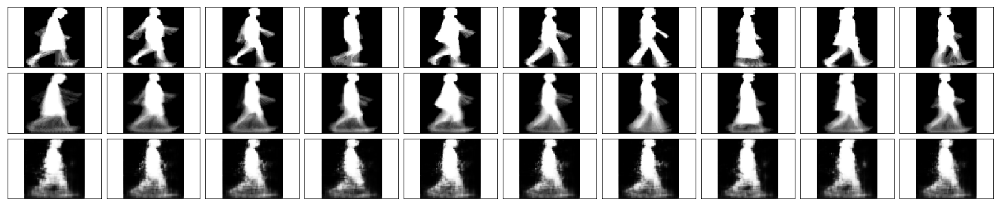

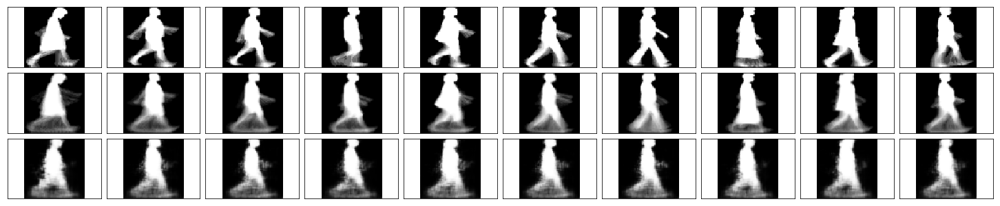

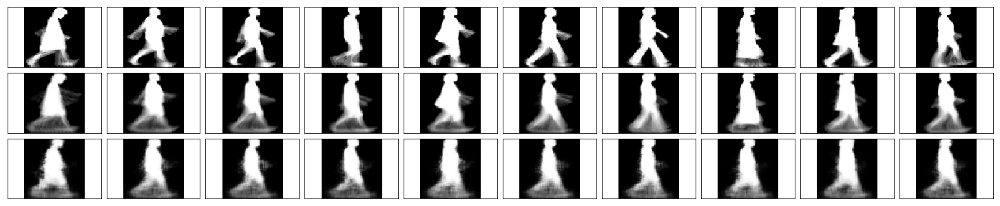

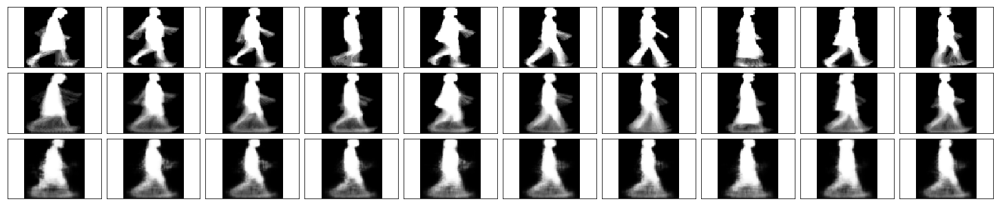

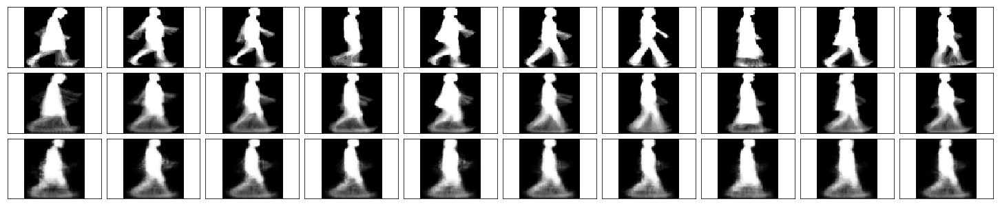

...

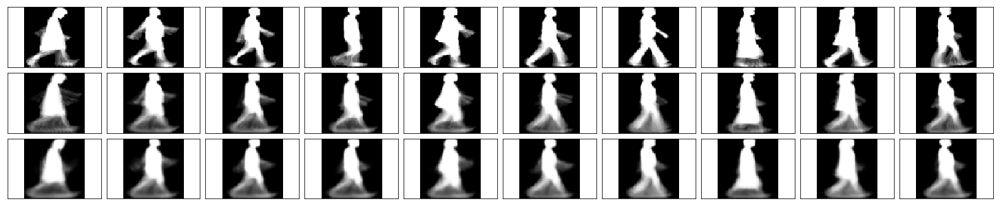

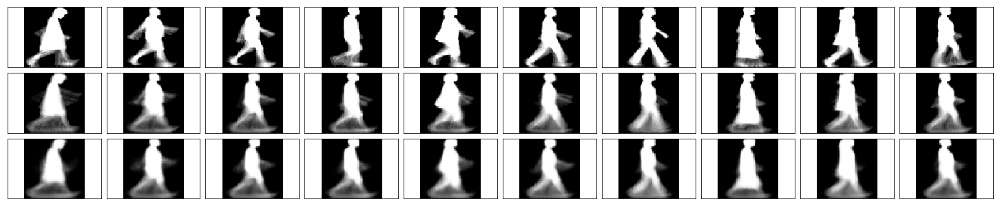

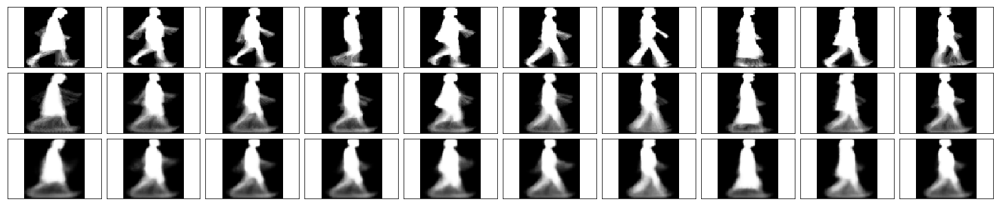

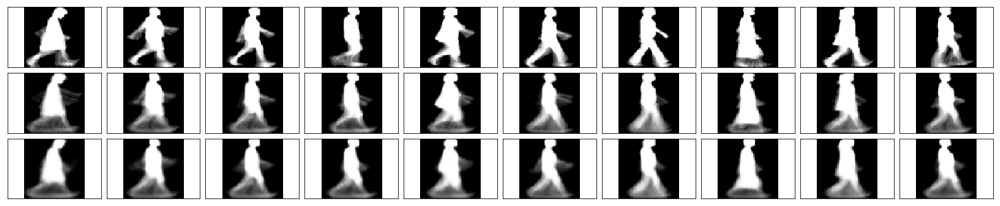

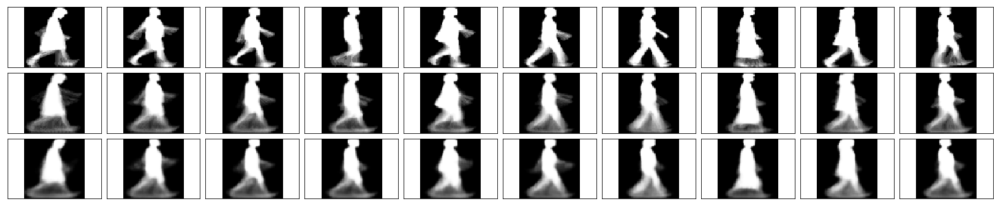

In [12]:
epochs = 3000
num_layers = 3
batch_size = 80

for lr in [0.0008]:
    save_string = './checkpoints_view_invariant/5f-full_E2E_lr={}_bs={}_nl={}.ckpt'.format(lr, batch_size, num_layers)
    with tf.Session(config=tf.ConfigProto(log_device_placement=True), graph=g) as sess:
        sess.run(tf.global_variables_initializer())

        iteration = 1
        mean_val_loss = 0
        mean_val_acc = 0
        count_loss_not_decrease_epochs = 0
        count_acc_not_decrease_epochs = 0
        Last_val_loss = 0
        Last_val_acc = 0


        for e in range(epochs):
            for train_batch, target_batch in get_batches(train_x, train_y, batch_size):

                start = time.time()

                feed_1 = {
                            inputs: train_batch, 
                            targets: target_batch,
                            keep_p: 0.5,
                            learning_rate: lr,
                            training:True
                        }

                train_loss, _, decoded_img, train_MSE = sess.run([cost, opt, decoded, MSE], feed_dict=feed_1)

                train_acc = cal_accuracy(decoded_img, target_batch)

                if iteration%25==0:
                    end = time.time()
                    print("Epoch: {}/{},".format(e+1, epochs),' '
                              "Iteration: {},".format(iteration),' '
                              "Train loss: {:.3f},".format(train_loss),' '
                              "Train MSE: {:.3f},".format(train_MSE),' '
                              "{:.1f}s /batch.".format((end-start)/5),' '
                              "Train Accuracy: %{:.3f}".format(train_acc))

                    ##############################################################
                    ######################## VALIDATION ##########################
                    ##############################################################

                if iteration%75==0:
                    validation_loss = []
                    validation_acc = []

                    if batch_size >= len(val_x):
                        val_batch_size = len(val_x)
                    else: 
                        val_batch_size = batch_size


                    for ii, (val_batch, val_target_batch) in enumerate(get_batches(val_x, val_y, val_batch_size)):
                        feed_2 = {
                                    inputs: val_batch,
                                    targets: val_target_batch,
                                    keep_p: 1,
                                    training:True
                                }

                        val_loss, val_decoded_img, val_MSE = sess.run([cost, decoded, MSE], feed_dict=feed_2)

                        val_acc = cal_accuracy(val_decoded_img, val_target_batch)

                        validation_loss.append(val_loss)
                        validation_acc.append(val_acc)

                    Last_val_loss = mean_val_loss
                    Last_val_acc = mean_val_acc
                    mean_val_loss = np.mean(np.array(validation_loss))
                    mean_val_acc = np.mean(np.array(validation_acc))

                    print()
                    print("Validation loss: {:.3f},".format(mean_val_loss),' '
                          "Validation MSE: {:.3f},".format(val_MSE),' '
                              "Validation accuracy: {:.3f},".format(mean_val_acc))
                    print()
                ####### plot #######
                if iteration%500==0:

                    feed_3 = {
                                inputs: val_x[:10],
                                keep_p: 1,
                                training:True
                                }

                    fig, axes = plt.subplots(nrows=3, ncols=10, sharex=True, sharey=True, figsize=(20,4))
                    in_imgs = val_x[:10]
                    reconstructed = sess.run(decoded, feed_dict=feed_3)
                    target_imgs = val_y[:10]
                    
                    # plot out
                    for images, row in zip([in_imgs, target_imgs, reconstructed], axes):
                        for img, ax in zip(images, row):
                            ax.imshow(img.reshape((64, 64)), cmap='Greys_r')
                            ax.get_xaxis().set_visible(False)
                            ax.get_yaxis().set_visible(False)


                    fig.tight_layout(pad=0.1)

                iteration += 1

                # Early stopping
                if mean_val_acc > 89.69:
                    break
    #             if mean_val_Acc - Last_val_Acc <= -0.3:
    #                 count_Acc_not_increase_epochs += 1
    #             if Last_val_loss - mean_val_loss <= -0.01:
    #                 count_loss_not_decrease_epochs += 1

    #             if mean_val_Acc - Last_val_Acc <= -2:
    #                 break
    #             if count_Acc_not_increase_epochs >= 10:
    #                 break
    #             if count_loss_not_decrease_epochs >= 10:
    #                 break

        saver.save(sess, r"{}".format(save_string))
        
print(' ')
print(' ')
print("leraning_rate={},num_layers={},batch_size={} finished, saved".format(lr, num_layers, batch_size))
print(' ')
print(' ')

val_x (646, 64, 64, 1) val_y (646, 64, 64, 1)


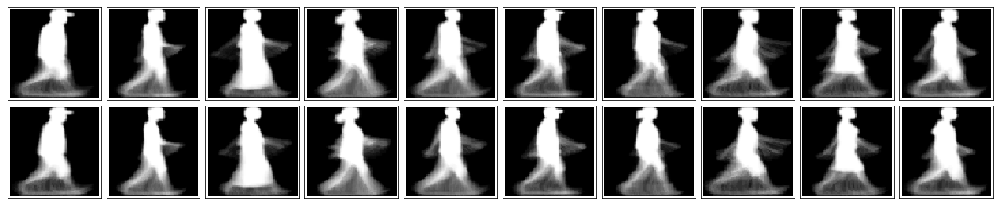

In [17]:
# Val X
val_x = gallery_full[2500:, 2]
val_x = np.reshape(val_x, [val_x.shape[0], val_x.shape[1], val_x.shape[2], 1])
# Val Y
val_y = gallery_full[2500:, 3]
val_y = np.reshape(val_y, [val_y.shape[0], val_y.shape[1], val_y.shape[2], 1])
print('val_x', val_x.shape, 'val_y', val_y.shape)

fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
in_imgs = val_x[:10]
# reconstructed = sess.run(decoded, feed_dict=feed_3)
target_imgs = val_y[:10]
                    
# plot out
for images, row in zip([in_imgs, target_imgs], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((64, 64)), cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)


fig.tight_layout(pad=0.1)


# Test Model: 5f-full_E2E_lr=0.0008_bs=80_nl=3.ckpt

In [6]:
gallery_full = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_full_Seq00', mode='rb'))
probe_full = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_full_Seq01', mode='rb'))

gallery_5f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_Seq00', mode='rb'))
probe_5f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_Seq01', mode='rb'))

gallery_5f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_2_Seq00', mode='rb'))
probe_5f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_2_Seq01', mode='rb'))

gallery_5f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_3_Seq00', mode='rb'))
probe_5f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_3_Seq01', mode='rb'))

gallery_full = gallery_full/float(255)
probe_full = probe_full/float(255)
gallery_5f = gallery_5f/float(255)
probe_5f = probe_5f/float(255)

gallery_5f_2 = gallery_5f_2/float(255)
probe_5f_2 = probe_5f_2/float(255)

gallery_5f_3 = gallery_5f_3/float(255)
probe_5f_3 = probe_5f_3/float(255)

In [7]:
# Val X
val_x = np.concatenate([gallery_5f[2146:2646, 3], probe_5f[2146:2646, 3], gallery_5f_2[2146:2646, 3], 
                        probe_5f_2[2146:2646, 3], gallery_5f_3[2146:2646, 3], probe_5f_3[2146:2646, 3]], axis=0)
val_x = np.reshape(val_x, [val_x.shape[0], val_x.shape[1], val_x.shape[2], 1])
# Val Y
val_y = np.concatenate([gallery_full[2146:2646, 3], probe_full[2146:2646, 3], gallery_full[2146:2646, 3], 
                        probe_full[2146:2646, 3], gallery_full[2146:2646, 3], probe_full[2146:2646, 3]], axis=0)
val_y = np.reshape(val_y, [val_y.shape[0], val_y.shape[1], val_y.shape[2], 1])
print('val_x', val_x.shape, 'val_y', val_y.shape)

# Test X
test_x = np.concatenate([gallery_5f[2646:, 3], probe_5f[2646:, 3], gallery_5f_2[2646:, 3], 
                         probe_5f_2[2646:, 3], gallery_5f_3[2646:, 3],probe_5f_3[2646:, 3]], axis=0)
test_x = np.reshape(test_x, [test_x.shape[0], test_x.shape[1], test_x.shape[2], 1])
# Test Y
test_y = np.concatenate([gallery_full[2646:, 3], probe_full[2646:, 3], gallery_full[2646:, 3], 
                         probe_full[2646:, 3], gallery_full[2646:, 3], probe_full[2646:, 3]], axis=0)
test_y = np.reshape(test_y, [test_y.shape[0], test_y.shape[1], test_y.shape[2], 1])
print('test_x', test_x.shape, 'test_y', test_y.shape)

val_x (3000, 64, 64, 1) val_y (3000, 64, 64, 1)
test_x (3000, 64, 64, 1) test_y (3000, 64, 64, 1)


In [8]:
def get_batches(data, target, batch_size):
    n_batches = len(data)//batch_size
    data = data[:batch_size * n_batches]
    target = target[:batch_size * n_batches]
    for ii in range(0, batch_size*n_batches, batch_size):
        data_batch = data[ii:ii + batch_size]
        target_batch = target[ii:ii + batch_size]
        
        yield data_batch, target_batch
        
def cal_accuracy(decoded, target):
    error = abs(decoded - target)
    Acc = (np.sum(error <= 0.08)/(decoded.shape[0]*decoded.shape[1]*decoded.shape[2]*decoded.shape[3]))*100
    
    return Acc

def save_decoded(decoded_batch, save_path, batch_number):
    reshape = np.reshape(decoded_batch, [decoded_batch.shape[0], decoded_batch.shape[1], decoded_batch.shape[2]])
    for ii, image in enumerate(reshape):
        imsave('{}/{}.png'.format(save_path, ii + batch_number*50 + 1), image)

In [12]:
# New_folder_path = './OULP-C1V2_Pack/OULP-GEI-(64x64)-5f-full_add_more_data_model/decoded_probe_5f_3'
# os.makedirs(New_folder_path)

test_batch_size = 50
loaded_graph = tf.Graph()
save_model_path = './checkpoints_view_invariant/5f-full_E2E_lr=0.0008_bs=80_nl=3.ckpt'
with tf.Session(graph=loaded_graph) as sess:
    # Load model
    loader = tf.train.import_meta_graph(save_model_path + '.meta')
    loader.restore(sess, save_model_path)

    # Get Tensors from loaded model
    test_inputs = loaded_graph.get_tensor_by_name('inputs:0')
    test_targets = loaded_graph.get_tensor_by_name('targets:0')
    test_training = loaded_graph.get_tensor_by_name('training:0')
    test_keep_p = loaded_graph.get_tensor_by_name('keep_prob:0')
    
    test_decoded = loaded_graph.get_tensor_by_name('output_layer/output:0')
#     test_MSE= loaded_graph.get_tensor_by_name('MSE:0')
    
#     test_mse = []
    test_acc = []
#     mean_test_mse = 0
    mean_test_acc = 0
    
    for ii, (test_batch, test_target_batch) in enumerate(get_batches(
                                     np.concatenate([val_x[1500:2000], test_x[1500:2000]], axis=0), 
                                     np.concatenate([val_y[1500:2000], test_y[1500:2000]], axis=0), test_batch_size)):
        feed_dict = {test_inputs: test_batch,
                     test_targets: test_target_batch,
                     test_training: 1,
                     test_training:True
                    }
        
        test_decoded_img = sess.run([test_decoded], feed_dict=feed_dict)
#         save_decoded(test_decoded_img, New_folder_path, ii)
        
        test_ACC = cal_accuracy(np.array(test_decoded_img), test_target_batch)
        
#         test_mse.append(test_mean_squared_error)
        test_acc.append(test_ACC)
    
#     mean_test_mse = np.mean(np.array(test_mse))
    mean_test_acc = np.mean(np.array(test_acc))
    
#     print('mean_test_mse: {:.4f}'.format(mean_test_mse))
    print('mean_test_acc: {:.4f}'.format(mean_test_acc))

INFO:tensorflow:Restoring parameters from ./checkpoints_view_invariant/5f-full_E2E_lr=0.0008_bs=80_nl=3.ckpt
mean_test_acc: 89.6536
